<a href="https://colab.research.google.com/github/NanThanThanSoe/DIP_ImageEnhancement/blob/master/DIP_Workshop2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Digital Image Processing

- Workshop 2
- By Nan Than Than Soe

In [0]:
# import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math
from math import sqrt,exp

from PIL import Image
import urllib.request
import io
import scipy
from scipy.fftpack import fft2, ifft2
from numpy import r_
from numpy import pi
from numpy import zeros

In [0]:
image1 = cv2.imread("/content/drive/My Drive/lena_gray.bmp", 0)
image2 = cv2.imread("/content/drive/My Drive/elaine.jpg", 0)
image3 = cv2.imread("/content/drive/My Drive/BOAT.bmp", 0)
image4 = cv2.imread("/content/drive/My Drive/monkey.jpg", 0)
image5 = cv2.imread("/content/drive/My Drive/pepper.jpg", 0)
mask = cv2.imread("/content/drive/My Drive/mask.jpg", 0)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf59a80f98>,
 Text(0.5, 1.0, 'Mask Image'))

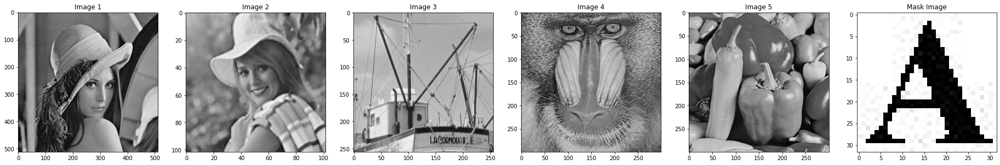

In [205]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image1,cmap='gray'), plt.title( "Image 1")
plt.subplot(162),plt.imshow(image2,cmap='gray'), plt.title( "Image 2")
plt.subplot(163),plt.imshow(image3,cmap='gray'), plt.title( "Image 3")
plt.subplot(164),plt.imshow(image4,cmap='gray'), plt.title( "Image 4")
plt.subplot(165),plt.imshow(image5,cmap='gray'), plt.title( "Image 5")
plt.subplot(166),plt.imshow(mask,cmap='gray'), plt.title( "Mask Image")

2D DFT with five test images

In [0]:
# function for 2dft to extract amplitude, phase, amplitude only image, phase only image and watermark image
def dft2_watermark(image):
  im1 = np.fft.fft2(image)
  im1 = np.fft.fftshift(im1)

  # amplitude image
  im1_amp = np.log(np.abs(im1))

  # phase image
  im1_phase = np.angle(im1)

  # phase only image
  im1_poi1 = np.fft.ifftshift(im1_phase)
  im1_poi2 = np.fft.ifft2(im1_poi1)
  im1_poi = np.angle(im1_poi2)
  # back to dft2
  im1_poi_dft = np.fft.fft2(im1_poi2)

  # amplitude only image
  im1_aoi1 = np.fft.ifftshift(im1_amp)
  im1_aoi2 = np.fft.ifft2(im1_aoi1)
  im1_aoi = np.abs(np.log(im1_aoi2))

  # apply watermark to amplitude only image
  src2 = cv2.resize(mask, im1_aoi.shape[1::-1])
  im1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, im1_amp, im1_phase, im1_aoi, im1_poi, im1_watermark

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf598a04a8>,
 Text(0.5, 1.0, 'Watermarked image'))

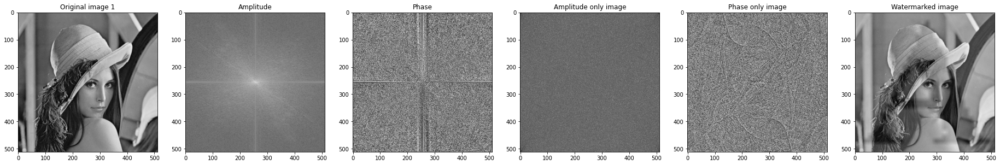

In [207]:
# apply 2dft function to image 1
im1,im1_amp, im1_phase, im1_aoi, im1_poi, im1_watermark = dft2_watermark(image1)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image1,cmap='gray'), plt.title( "Original image 1")
plt.subplot(162),plt.imshow(im1_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im1_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im1_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im1_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im1_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf59630cf8>,
 Text(0.5, 1.0, 'Watermarked image'))

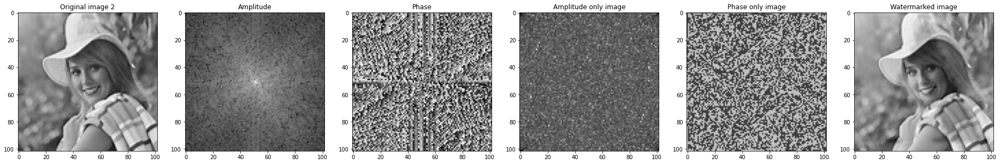

In [208]:
# apply 2dft function to image 2
im2,im2_amp, im2_phase, im2_aoi, im2_poi, im2_watermark = dft2_watermark(image2)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image2,cmap='gray'), plt.title( "Original image 2")
plt.subplot(162),plt.imshow(im2_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im2_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im2_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im2_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im2_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5af0f908>,
 Text(0.5, 1.0, 'Watermarked image'))

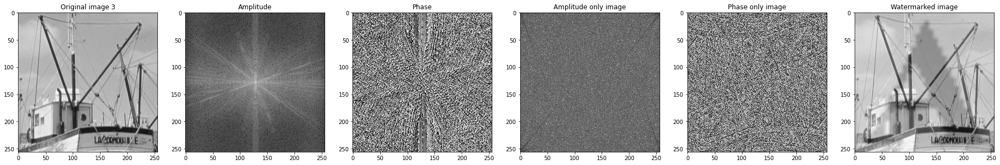

In [209]:
# apply 2dft function to image 3
im3,im3_amp, im3_phase, im3_aoi, im3_poi, im3_watermark = dft2_watermark(image3)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image3,cmap='gray'), plt.title( "Original image 3")
plt.subplot(162),plt.imshow(im3_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im3_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im3_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im3_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im3_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5ab32630>,
 Text(0.5, 1.0, 'Watermarked image'))

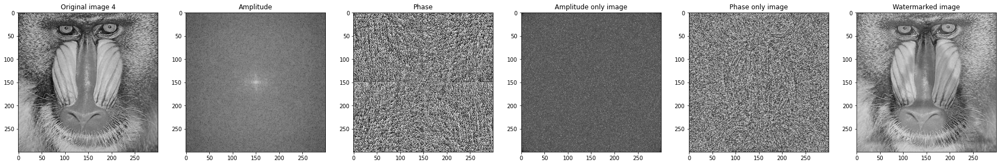

In [210]:
# apply 2dft function to image 4
im4,im4_amp, im4_phase, im4_aoi, im4_poi, im4_watermark = dft2_watermark(image4)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image4,cmap='gray'), plt.title( "Original image 4")
plt.subplot(162),plt.imshow(im4_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im4_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im4_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im4_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im4_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf59438e48>,
 Text(0.5, 1.0, 'Watermarked image'))

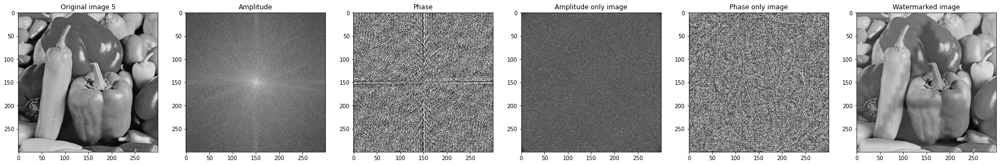

In [211]:
# apply 2dft function to image 5
im5,im5_amp, im5_phase, im5_aoi, im5_poi, im5_watermark = dft2_watermark(image5)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image5,cmap='gray'), plt.title( "Original image 5")
plt.subplot(162),plt.imshow(im5_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im5_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im5_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im5_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im5_watermark,cmap='gray'), plt.title( "Watermarked image")

In [212]:
# Calculate PSNR of 2D DFT
def compute_psnr(img1, img2):
  img1 = cv2.resize(img1, (256, 256))
  img2 = cv2.resize(img2, (256, 256))
  img1 = img1.astype(np.float64) / 255.
  img2 = img2.astype(np.float64) / 255.
  mse = np.mean((img1 - img2) ** 2)
  if mse == 0:
      return "Same Image"
  return 10 * math.log10(1. / mse)

im1_psnr = compute_psnr(image1,im1_watermark)
im2_psnr = compute_psnr(image2,im2_watermark)
im3_psnr = compute_psnr(image3,im3_watermark)
im4_psnr = compute_psnr(image4,im4_watermark)
im5_psnr = compute_psnr(image5,im5_watermark)
print('image1 psnr: ', im1_psnr)
print('image2 psnr: ', im2_psnr)
print('image3 psnr: ', im3_psnr)
print('image4 psnr: ', im4_psnr)
print('image5 psnr: ', im5_psnr)

image1 psnr:  14.142014188205943
image2 psnr:  13.511508635389447
image3 psnr:  13.193544588382405
image4 psnr:  14.003763945447714
image5 psnr:  14.148216216470527


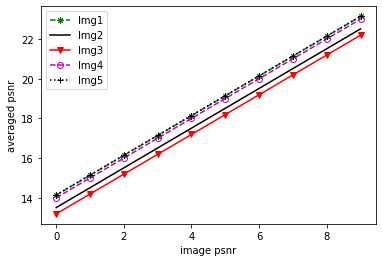

In [213]:
# plot psnr of images
x=np.arange(10)
fig=plt.figure()
ax=fig.add_subplot()
ax.plot(x,x+im1_psnr,c='g',marker=(8,2,0),ls='--',label='Img1')
ax.plot(x,x+im2_psnr,c='k',ls='-',label='Img2')
ax.plot(x,x+im3_psnr,c='r',marker="v",ls='-',label='Img3')
ax.plot(x,x+im4_psnr,c='m',marker="o",ls='--',label='Img4',fillstyle='none')
ax.plot(x,x+im5_psnr,c='k',marker="+",ls=':',label='Img5')
plt.xlabel('image psnr')
plt.ylabel('averaged psnr')
plt.legend(loc=2)
plt.show()

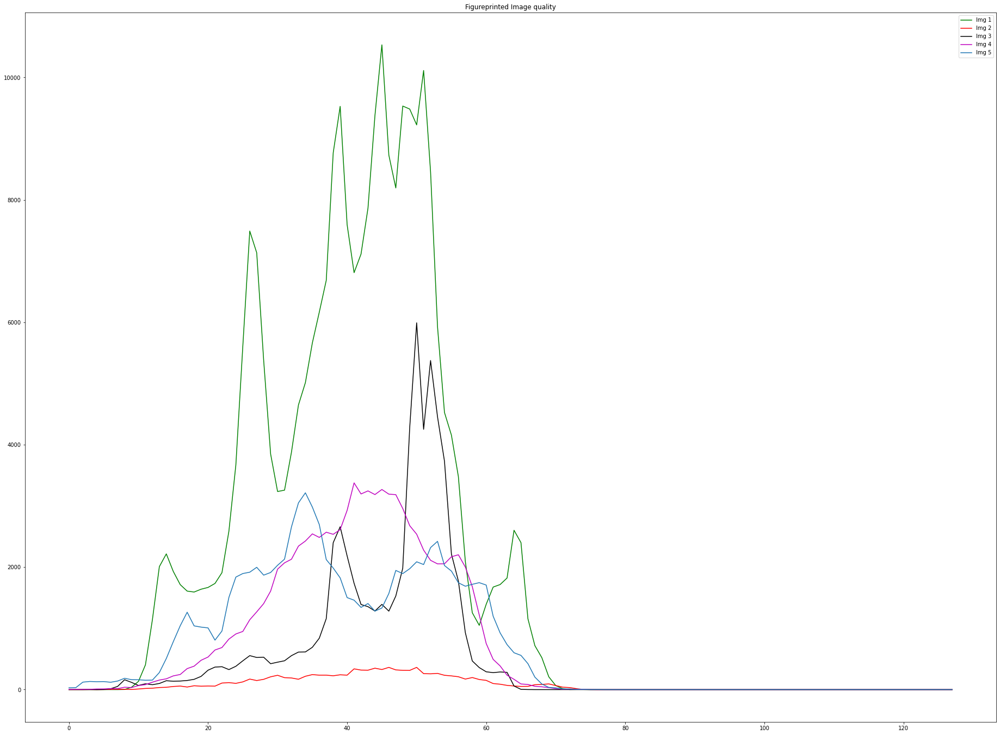

In [214]:
## CALLING OPNECV INBUILT HISTOGRAM FUNCTION
# 2D DFT watermark image

im1_hist = cv2.calcHist([im1_watermark],[0],None,[128],[0,256])
im2_hist = cv2.calcHist([im2_watermark],[0],None,[128],[0,256])
im3_hist = cv2.calcHist([im3_watermark],[0],None,[128],[0,256])
im4_hist = cv2.calcHist([im4_watermark],[0],None,[128],[0,256])
im5_hist = cv2.calcHist([im5_watermark],[0],None,[128],[0,256])
 
## PLOTTING HISTOGRAM FOR VERIFICATION
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.title("Figureprinted Image quality")
plt.plot(im1_hist,'g', label="Img 1") 
plt.plot(im2_hist,'r', label="Img 2") 
plt.plot(im3_hist,'k', label="Img 3") 
plt.plot(im4_hist,'m', label="Img 4") 
plt.plot(im5_hist, label="Img 5") 
plt.legend()
plt.show()

2D DFT with RSA

In [0]:
#define rsa
def rsa(h, w, seed = 13):
  res = np.zeros((h, w))
  np.random.seed(seed)
  for i in range(h):
    for j in range(w):
      res[i,j] = (-1 if (np.random.random() > 0.5) else 1)
  res = res - np.tril(res, -1) + np.transpose(np.triu(res, 1))
  return res

# function for adding random sign
def random_sign(image):
  h, w = image.shape
  res = []
  for i in range(h):
    for j in range(w):
      if(image[i,j] < 0):
        res.append(-1)
        image[i,j] = image[i,j]*(-1)
      else:
        res.append(1) 
  res = np.asarray(res)
  res = np.reshape(res, (h, w))

  return image, res

# function adding rsa to image
def add_rsa(image, sign):
  h, w = image.shape
  res = []
  for i in range(h):
    for j in range(w):
      res.append(image[i,j]*sign[i,j])
  res = np.asarray(res)
  res = np.reshape(res, (h, w))

  return res

In [0]:
# function for 2dft w/ rsa to extract amplitude, phase, amplitude only image, phase only image and watermark image
def dft2_rsa_watermark(image):
  im1 = np.fft.fft2(image)
  im1 = np.fft.fftshift(im1)

  # amplitude image
  im1_amp = np.log(np.abs(im1))

  # phase image
  im1_phase = np.angle(im1)

  # phase only image
  im1_poi1 = np.fft.ifftshift(im1_phase)
  im1_poi2 = np.fft.ifft2(im1_poi1)
  im1_poi = np.angle(im1_poi2)
  # back to dft2
  im1_poi_dft = np.fft.fft2(im1_poi2)

  # amplitude only image with rsa
  
  h, w = image.shape
  dft2r_im1 = cv2.dft(np.float32(image)/255.0)
  dft2r_im1 = dft2r_im1*255.0
  im1_amp, sign = random_sign(dft2r_im1)
  dft2_rsa = rsa(h,w,seed=13)
  dft2_ampoi = add_rsa(im1_amp, dft2_rsa)
  im1_rsa_aoi = cv2.idft(dft2_ampoi)

  # apply watermark to amplitude only image
  src2 = cv2.resize(mask, im1_rsa_aoi.shape[1::-1])
  im1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, im1_amp, im1_phase, im1_rsa_aoi, im1_poi, im1_watermark

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf59152128>,
 Text(0.5, 1.0, 'Watermarked image'))

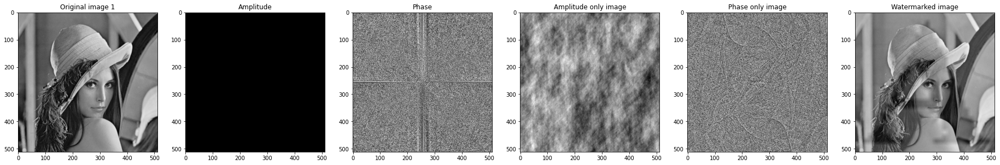

In [217]:
# apply 2dft rsa function to image 1
im1,im1_rsa_amp, im1_rsa_phase, im1_rsa_aoi, im1_rsa_poi, im1_rsa_watermark = dft2_rsa_watermark(image1)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image1,cmap='gray'), plt.title( "Original image 1")
plt.subplot(162),plt.imshow(im1_rsa_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im1_rsa_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im1_rsa_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im1_rsa_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im1_rsa_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf58f5d978>,
 Text(0.5, 1.0, 'Watermarked image'))

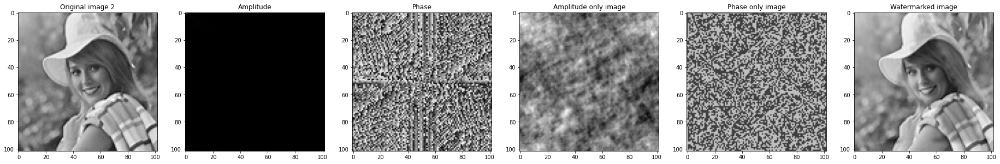

In [218]:
# apply 2dft rsa function to image 2
im2,im2_rsa_amp, im2_rsa_phase, im2_rsa_aoi, im2_rsa_poi, im2_rsa_watermark = dft2_rsa_watermark(image2)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image2,cmap='gray'), plt.title( "Original image 2")
plt.subplot(162),plt.imshow(im2_rsa_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im2_rsa_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im2_rsa_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im2_rsa_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im2_rsa_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf58cf4208>,
 Text(0.5, 1.0, 'Watermarked image'))

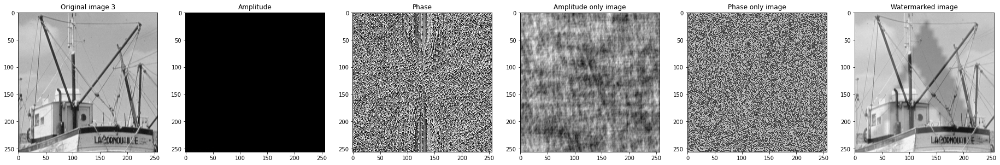

In [219]:
# apply 2dft rsa function to image 3
im3,im3_rsa_amp, im3_rsa_phase, im3_rsa_aoi, im3_rsa_poi, im3_rsa_watermark = dft2_rsa_watermark(image3)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image3,cmap='gray'), plt.title( "Original image 3")
plt.subplot(162),plt.imshow(im3_rsa_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im3_rsa_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im3_rsa_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im3_rsa_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im3_rsa_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf58b03908>,
 Text(0.5, 1.0, 'Watermarked image'))

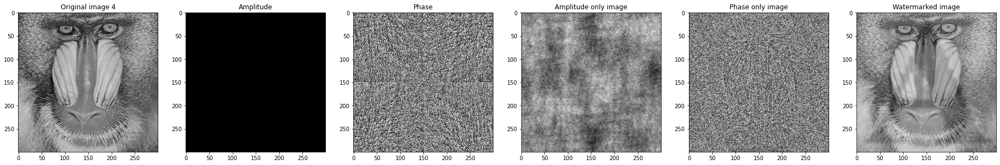

In [220]:
# apply 2dft rsa function to image 4
im4,im4_rsa_amp, im4_rsa_phase, im4_rsa_aoi, im4_rsa_poi, im4_rsa_watermark = dft2_rsa_watermark(image4)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image4,cmap='gray'), plt.title( "Original image 4")
plt.subplot(162),plt.imshow(im4_rsa_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im4_rsa_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im4_rsa_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im4_rsa_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im4_rsa_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5891d198>,
 Text(0.5, 1.0, 'Watermarked image'))

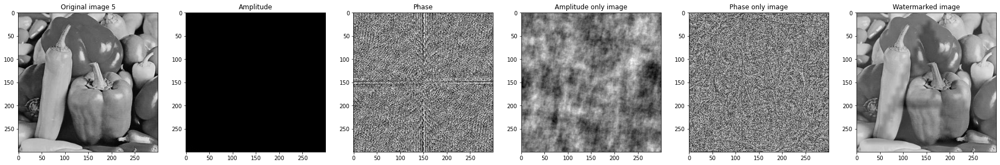

In [221]:
# apply 2dft rsa function to image 5
im5,im5_rsa_amp, im5_rsa_phase, im5_rsa_aoi, im5_rsa_poi, im5_rsa_watermark = dft2_rsa_watermark(image5)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image5,cmap='gray'), plt.title( "Original image 5")
plt.subplot(162),plt.imshow(im5_rsa_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(im5_rsa_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(im5_rsa_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(im5_rsa_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(im5_rsa_watermark,cmap='gray'), plt.title( "Watermarked image")

In [222]:
# compute psnr of 2dft w/ rsa image
im1_rsa_psnr = compute_psnr(image1,im1_rsa_watermark)
im2_rsa_psnr = compute_psnr(image2,im2_rsa_watermark)
im3_rsa_psnr = compute_psnr(image3,im3_rsa_watermark)
im4_rsa_psnr = compute_psnr(image4,im4_rsa_watermark)
im5_rsa_psnr = compute_psnr(image5,im5_rsa_watermark)
print('image1 psnr: ', im1_rsa_psnr)
print('image2 psnr: ', im2_rsa_psnr)
print('image3 psnr: ', im3_rsa_psnr)
print('image4 psnr: ', im4_rsa_psnr)
print('image5 psnr: ', im5_rsa_psnr)

image1 psnr:  14.142014188205943
image2 psnr:  13.511508635389447
image3 psnr:  13.193544588382405
image4 psnr:  14.003763945447714
image5 psnr:  14.148216216470527


1D DFT with five test images

In [0]:
# 1DFT by using numpy and opencv
# amplitude and phase
def dft1_watermark(image):
  imdft1 = np.fft.fft(image)
  imdft1 = np.fft.fftshift(imdft1)

  # amplitude image
  imdft1_amp = np.log(np.abs(imdft1))

  # phase image
  imdft1_phase = np.angle(imdft1)

  # phase only image
  imdft1_poi1 = np.fft.ifftshift(imdft1_phase)
  imdft1_poi2 = np.fft.ifft(imdft1_poi1)
  imdft1_poi = np.angle(imdft1_poi2)
  # back to dft2
  imdft1_poi_dft = np.fft.fft(imdft1_poi2)

  # amplitude only image
  imdft1_aoi1 = np.fft.ifftshift(imdft1_amp)
  imdft1_aoi2 = np.fft.ifft(imdft1_aoi1)
  imdft1_aoi = np.abs(np.log(imdft1_aoi2))

  # apply watermark
  src2 = cv2.resize(mask, imdft1_aoi.shape[1::-1])
  imdft1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, imdft1_amp, imdft1_phase, imdft1_aoi, imdft1_poi, imdft1_watermark


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf586ac978>,
 Text(0.5, 1.0, 'Watermarked image'))

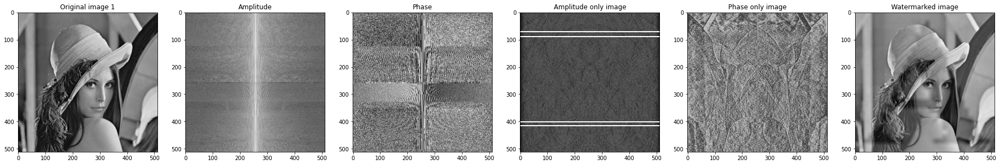

In [224]:
# apply 1dft to image
image1, imdft1_amp, imdft1_phase, imdft1_aoi, imdft1_poi, imdft1_watermark = dft1_watermark(image1)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image1,cmap='gray'), plt.title( "Original image 1")
plt.subplot(162),plt.imshow(imdft1_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(imdft1_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(imdft1_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(imdft1_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(imdft1_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf584c2208>,
 Text(0.5, 1.0, 'Watermarked image'))

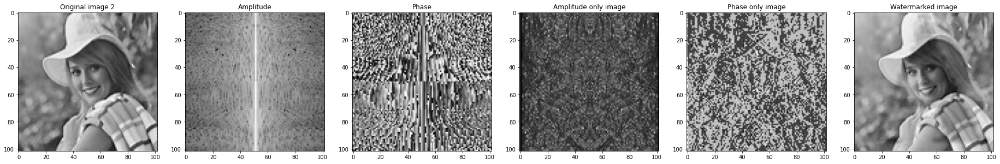

In [225]:
# apply 1dft to image
image2, imdft2_amp, imdft2_phase, imdft2_aoi, imdft2_poi, imdft2_watermark = dft1_watermark(image2)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image2,cmap='gray'), plt.title( "Original image 2")
plt.subplot(162),plt.imshow(imdft2_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(imdft2_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(imdft2_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(imdft2_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(imdft2_watermark,cmap='gray'), plt.title( "Watermarked image")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf582d1908>,
 Text(0.5, 1.0, 'Watermarked image'))

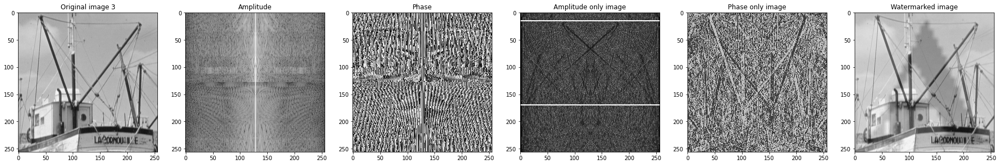

In [226]:
# apply 1dft to image
image3, imdft3_amp, imdft3_phase, imdft3_aoi, imdft3_poi, imdft3_watermark = dft1_watermark(image3)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image3,cmap='gray'), plt.title( "Original image 3")
plt.subplot(162),plt.imshow(imdft3_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(imdft3_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(imdft3_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(imdft3_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(imdft3_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf58068048>,
 Text(0.5, 1.0, 'Watermarked image'))

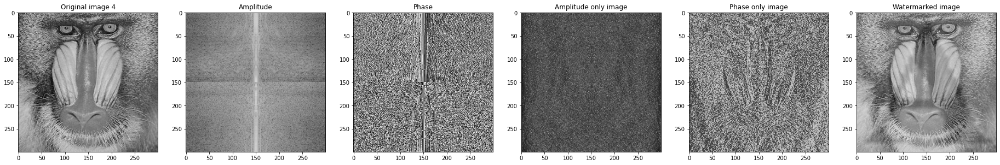

In [227]:
# apply 1dft to image
image4, imdft4_amp, imdft4_phase, imdft4_aoi, imdft4_poi, imdft4_watermark = dft1_watermark(image4)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image4,cmap='gray'), plt.title( "Original image 4")
plt.subplot(162),plt.imshow(imdft4_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(imdft4_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(imdft4_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(imdft4_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(imdft4_watermark,cmap='gray'), plt.title( "Watermarked image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57e76748>,
 Text(0.5, 1.0, 'Watermarked image'))

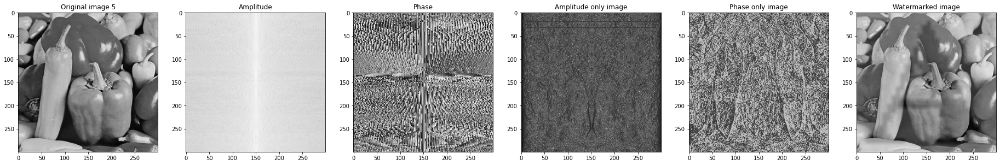

In [228]:
# apply 1dft to image
image5, imdft5_amp, imdft5_phase, imdft5_aoi, imdft5_poi, imdft5_watermark = dft1_watermark(image5)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(image5,cmap='gray'), plt.title( "Original image 5")
plt.subplot(162),plt.imshow(imdft5_amp,cmap='gray'), plt.title( "Amplitude")
plt.subplot(163),plt.imshow(imdft5_phase,cmap='gray'), plt.title( "Phase")
plt.subplot(164),plt.imshow(imdft5_aoi,cmap='gray'), plt.title( "Amplitude only image")
plt.subplot(165),plt.imshow(imdft5_poi,cmap='gray'), plt.title( "Phase only image")
plt.subplot(166),plt.imshow(imdft5_watermark,cmap='gray'), plt.title( "Watermarked image")

In [229]:
# Calculate PSNR of 1D DFT
def dft_psnr(img1, img2):
  img1 = cv2.resize(img1, (256, 256))
  img2 = cv2.resize(img2, (256, 256))
  img1 = img1.astype(np.float64) / 255.
  img2 = img2.astype(np.float64) / 255.
  mse = np.mean((img1 - img2) ** 2)
  if mse == 0:
      return "Same Image"
  return 10 * math.log10(1. / mse)

imdft1_psnr = dft_psnr(image1,imdft1_watermark)
imdft2_psnr = dft_psnr(image2,imdft2_watermark)
imdft3_psnr = dft_psnr(image3,imdft3_watermark)
imdft4_psnr = dft_psnr(image4,imdft4_watermark)
imdft5_psnr = dft_psnr(image5,imdft5_watermark)
print('image1 psnr: ', imdft1_psnr)
print('image2 psnr: ', imdft2_psnr)
print('image3 psnr: ', imdft3_psnr)
print('image4 psnr: ', imdft4_psnr)
print('image5 psnr: ', imdft5_psnr)

image1 psnr:  14.142014188205943
image2 psnr:  13.511508635389447
image3 psnr:  13.193544588382405
image4 psnr:  14.003763945447714
image5 psnr:  14.148216216470527


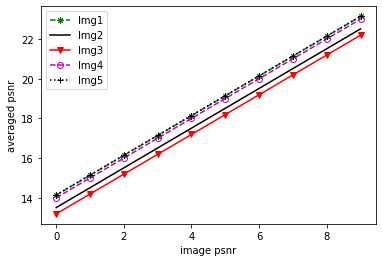

In [230]:
# plot psnr of images 1D DFT
x=np.arange(10)
fig=plt.figure()
ax=fig.add_subplot()
ax.plot(x,x+imdft1_psnr,c='g',marker=(8,2,0),ls='--',label='Img1')
ax.plot(x,x+imdft2_psnr,c='k',ls='-',label='Img2')
ax.plot(x,x+imdft3_psnr,c='r',marker="v",ls='-',label='Img3')
ax.plot(x,x+imdft4_psnr,c='m',marker="o",ls='--',label='Img4',fillstyle='none')
ax.plot(x,x+imdft5_psnr,c='k',marker="+",ls=':',label='Img5')
plt.xlabel('image psnr')
plt.ylabel('averaged psnr')
plt.legend(loc=2)
plt.show()

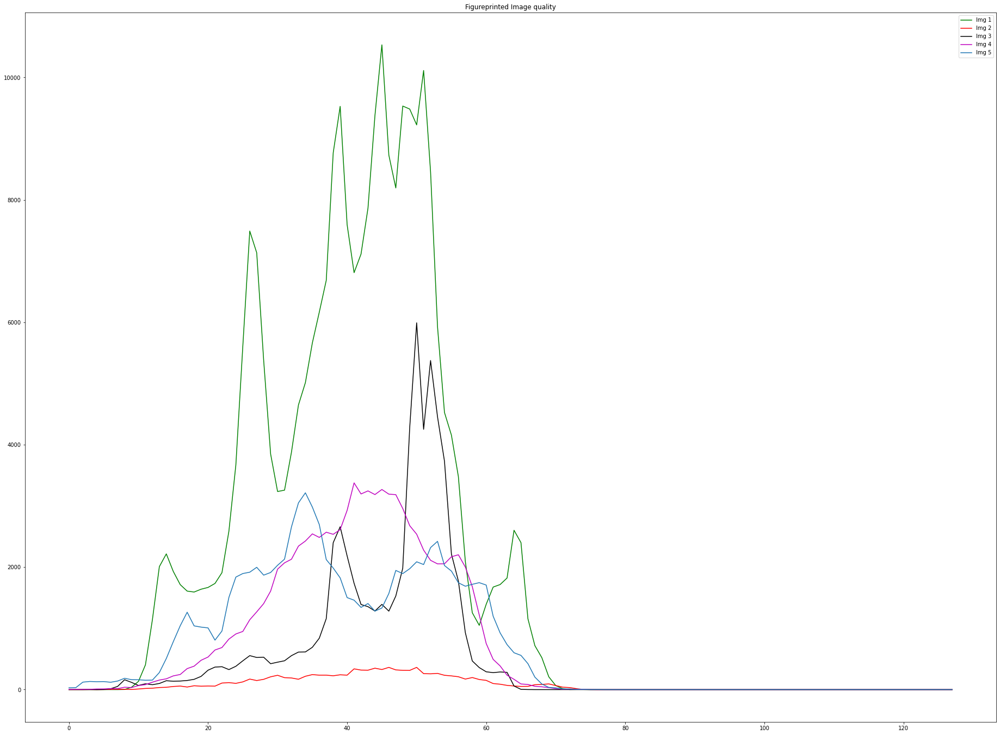

In [231]:
## CALLING OPNECV INBUILT HISTOGRAM FUNCTION
# 1D DFT watermark image

imdft1_hist = cv2.calcHist([imdft1_watermark],[0],None,[128],[0,256])
imdft2_hist = cv2.calcHist([imdft2_watermark],[0],None,[128],[0,256])
imdft3_hist = cv2.calcHist([imdft3_watermark],[0],None,[128],[0,256])
imdft4_hist = cv2.calcHist([imdft4_watermark],[0],None,[128],[0,256])
imdft5_hist = cv2.calcHist([imdft5_watermark],[0],None,[128],[0,256])
 
## PLOTTING HISTOGRAM FOR VERIFICATION
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.title("Figureprinted Image quality")
plt.plot(imdft1_hist,'g', label="Img 1") 
plt.plot(imdft2_hist,'r', label="Img 2") 
plt.plot(imdft3_hist,'k', label="Img 3") 
plt.plot(imdft4_hist,'m', label="Img 4") 
plt.plot(imdft5_hist, label="Img 5") 
plt.legend()
plt.show()

1DCT with five test images

In [0]:
from scipy.fftpack import dct, idct

In [0]:
# define function dct1 to extract amplitude only image and watermarked image
def dct1_watermark(image):
  # apply dct to images
  im1_dct = dct(image)
  im1_dct_amp = np.abs(im1_dct)   #amplitude
  im1_dct_aoi = idct(im1_dct_amp)  #amplitude only image
  im1_dct_i = idct(im1_dct)

  src2 = cv2.resize(mask, im1_dct_aoi.shape)
  imdct1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, im1_dct_aoi, imdct1_watermark

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57c5eba8>,
 (-0.5, 511.5, 511.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

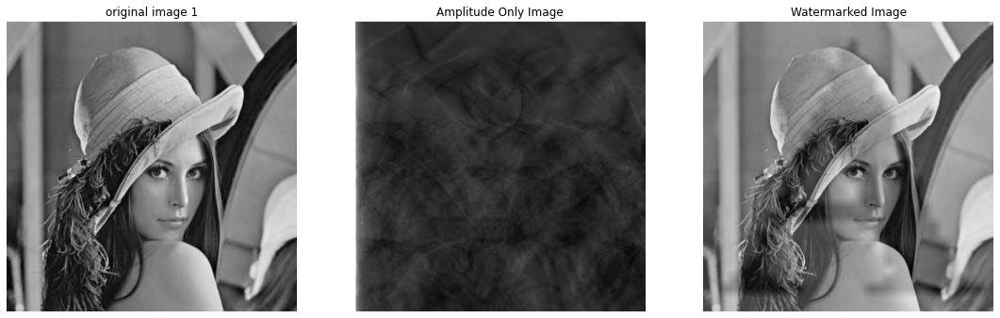

In [234]:
image1,  im1_dct_aoi, imdct1_watermark = dct1_watermark(image1)
# show images -> 1DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image1, 'gray'), plt.axis('off'), plt.title('original image 1')
plt.subplot(152), plt.imshow(im1_dct_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(imdct1_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57b53828>,
 (-0.5, 101.5, 101.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

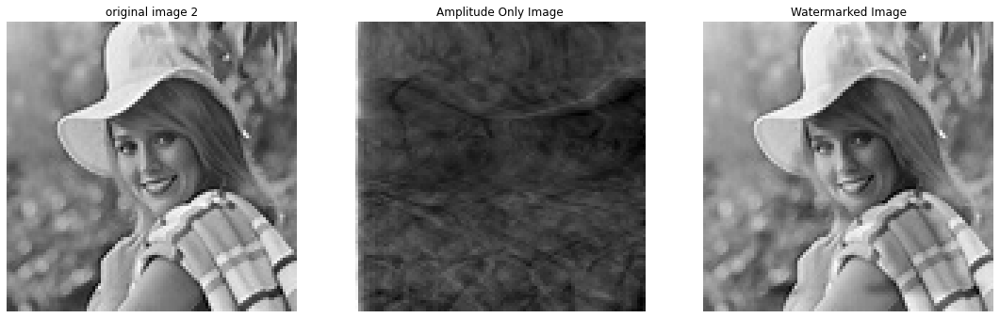

In [235]:
image2,  im2_dct_aoi, imdct2_watermark = dct1_watermark(image2)
# show images -> 1DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image2, 'gray'), plt.axis('off'), plt.title('original image 2')
plt.subplot(152), plt.imshow(im2_dct_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(imdct2_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57a474a8>,
 (-0.5, 255.5, 255.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

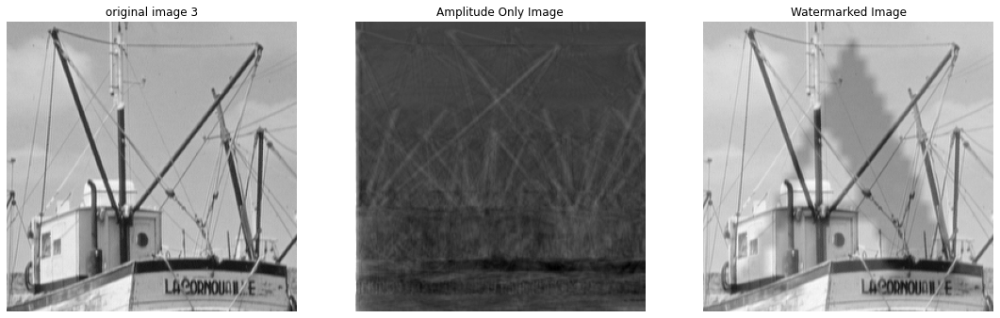

In [236]:
image3,  im3_dct_aoi, imdct3_watermark = dct1_watermark(image3)
# show images -> 1DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image3, 'gray'), plt.axis('off'), plt.title('original image 3')
plt.subplot(152), plt.imshow(im3_dct_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(imdct3_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5793a128>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

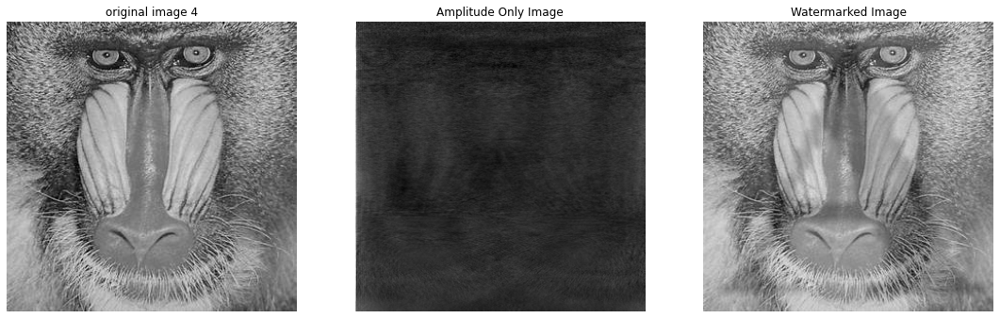

In [237]:
image4,  im4_dct_aoi, imdct4_watermark = dct1_watermark(image4)
# show images -> 1DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image4, 'gray'), plt.axis('off'), plt.title('original image 4')
plt.subplot(152), plt.imshow(im4_dct_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(imdct4_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5782bd68>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

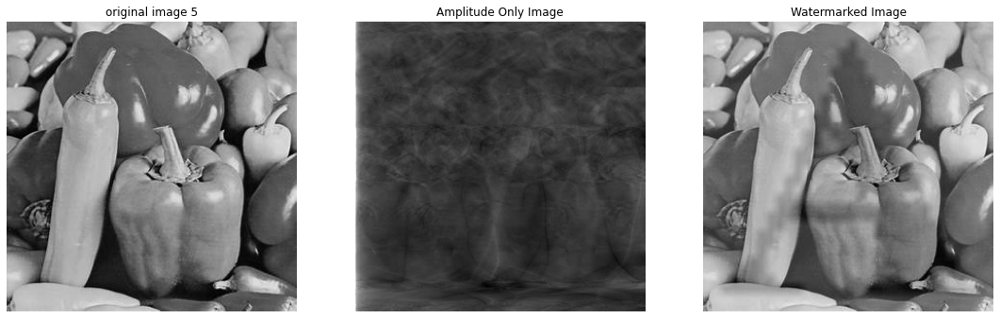

In [238]:
image5,  im5_dct_aoi, imdct5_watermark = dct1_watermark(image5)
# show images -> 1DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image5, 'gray'), plt.axis('off'), plt.title('original image 5')
plt.subplot(152), plt.imshow(im5_dct_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(imdct5_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [239]:
# Calculate PSNR of 1DCT
def dct_psnr(img1, img2):
  img1 = cv2.resize(img1, (256, 256))
  img2 = cv2.resize(img2, (256, 256))
  img1 = img1.astype(np.float64) / 255.
  img2 = img2.astype(np.float64) / 255.
  mse = np.mean((img1 - img2) ** 2)
  if mse == 0:
      return "Same Image"
  return 20 * math.log10(1. / mse)

imdct1_psnr = dct_psnr(image1,imdct1_watermark)
imdct2_psnr = dct_psnr(image2,imdct2_watermark)
imdct3_psnr = dct_psnr(image3,imdct3_watermark)
imdct4_psnr = dct_psnr(image4,imdct4_watermark)
imdct5_psnr = dct_psnr(image5,imdct5_watermark)
print('image1 psnr: ', imdct1_psnr)
print('image2 psnr: ', imdct2_psnr)
print('image3 psnr: ', imdct3_psnr)
print('image4 psnr: ', imdct4_psnr)
print('image5 psnr: ', imdct5_psnr)

image1 psnr:  28.284028376411886
image2 psnr:  27.023017270778894
image3 psnr:  26.38708917676481
image4 psnr:  28.007527890895428
image5 psnr:  28.296432432941053


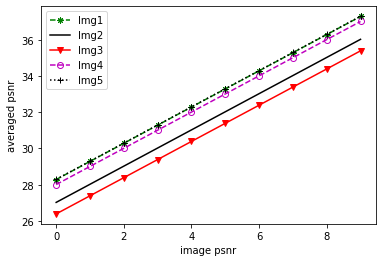

In [240]:
# plot psnr of images 1DCT
x=np.arange(10)
fig=plt.figure()
ax=fig.add_subplot()
ax.plot(x,x+imdct1_psnr,c='g',marker=(8,2,0),ls='--',label='Img1')
ax.plot(x,x+imdct2_psnr,c='k',ls='-',label='Img2')
ax.plot(x,x+imdct3_psnr,c='r',marker="v",ls='-',label='Img3')
ax.plot(x,x+imdct4_psnr,c='m',marker="o",ls='--',label='Img4',fillstyle='none')
ax.plot(x,x+imdct5_psnr,c='k',marker="+",ls=':',label='Img5')
plt.xlabel('image psnr')
plt.ylabel('averaged psnr')
plt.legend(loc=2)
plt.show()

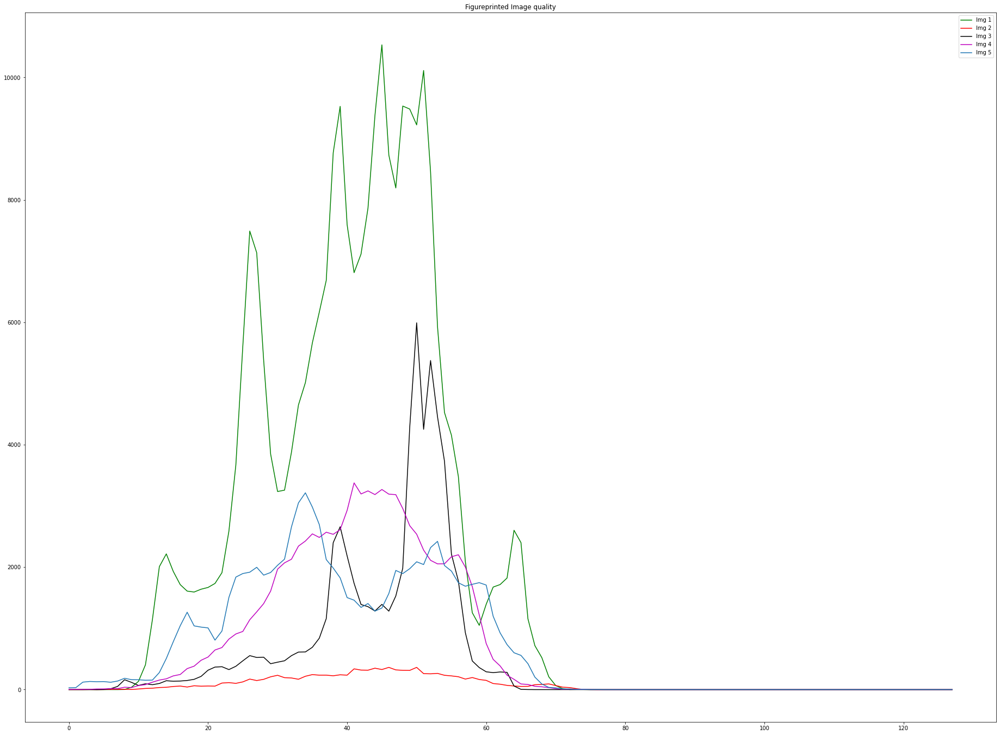

In [241]:
## CALLING OPNECV INBUILT HISTOGRAM FUNCTION
# 1DCT watermark image

imdct1_hist = cv2.calcHist([imdct1_watermark],[0],None,[128],[0,256])
imdct2_hist = cv2.calcHist([imdct2_watermark],[0],None,[128],[0,256])
imdct3_hist = cv2.calcHist([imdct3_watermark],[0],None,[128],[0,256])
imdct4_hist = cv2.calcHist([imdct4_watermark],[0],None,[128],[0,256])
imdct5_hist = cv2.calcHist([imdct5_watermark],[0],None,[128],[0,256])
 
## PLOTTING HISTOGRAM FOR VERIFICATION
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.title("Figureprinted Image quality")
plt.plot(imdct1_hist,'g', label="Img 1") 
plt.plot(imdct2_hist,'r', label="Img 2") 
plt.plot(imdct3_hist,'k', label="Img 3") 
plt.plot(imdct4_hist,'m', label="Img 4") 
plt.plot(imdct5_hist, label="Img 5") 
plt.legend()
plt.show()

2DCT with five test images

In [0]:
# define dct2 function to exxtract amplitude only image and watermarked image
def dct2_watermark(image):
  # apply dct2 to images
  dct2_im1 = dct(dct(image))
  dct2_im1_amp = np.log(np.abs(dct2_im1))   #amplitude
  #amplitude only image
  dct2_im1_ao = cv2.idct(dct2_im1_amp)
  dct2_im1_aoi = np.log(np.abs(dct2_im1_ao))
  dct2_im1_i = idct(idct(dct2_im1))

  src2 = cv2.resize(mask, dct2_im1_aoi.shape)
  dct2_im1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, dct2_im1_aoi, dct2_im1_watermark

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf576a4898>,
 (-0.5, 511.5, 511.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

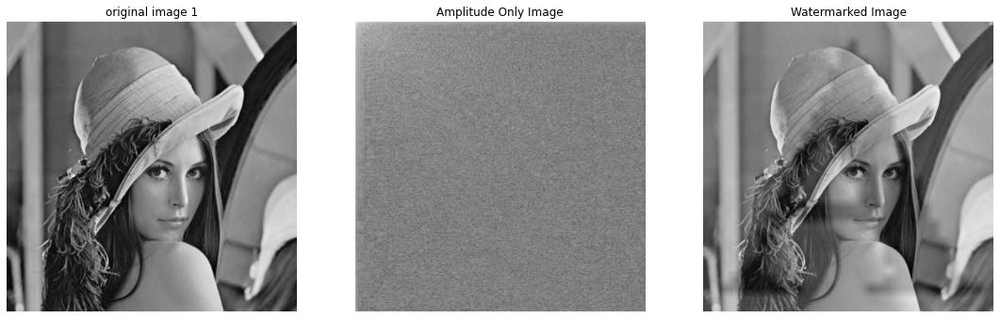

In [243]:
# apply dct2 to image
image1, dct2_im1_aoi, dct2_im1_watermark = dct2_watermark(image1)
# show images -> 2DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image1, 'gray'), plt.axis('off'), plt.title('original image 1')
plt.subplot(152), plt.imshow(dct2_im1_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_im1_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [244]:
# Calculate PSNR of 2DCT
MSE = 0
height, width = image1.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_im1_watermark[i,j] - image1[i,j]),2) / (height*width)

dct2_im1psnr = 20*np.log10(np.amax(image1)) - 10*np.log10(MSE)
print('image1 psnr: ', dct2_im1psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image1 psnr:  1.4060762986521453


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57599588>,
 (-0.5, 101.5, 101.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

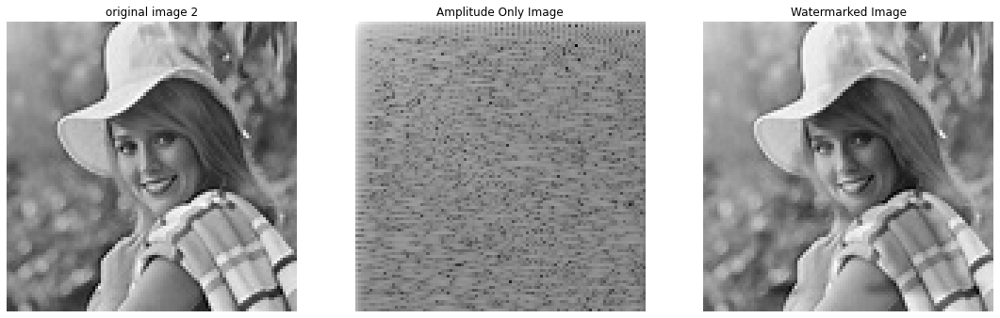

In [245]:
# apply dct2 to image
image2, dct2_im2_aoi, dct2_im2_watermark = dct2_watermark(image2)
# show images -> 2DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image2, 'gray'), plt.axis('off'), plt.title('original image 2')
plt.subplot(152), plt.imshow(dct2_im2_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_im2_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [246]:
# Calculate PSNR of 2DCT
MSE = 0
height, width = image2.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_im2_watermark[i,j] - image2[i,j]),2) / (height*width)

dct2_im2psnr = 20*np.log10(np.amax(image2)) - 10*np.log10(MSE)
print('image2 psnr: ', dct2_im2psnr)

image2 psnr:  1.7992403176444611


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5748c278>,
 (-0.5, 255.5, 255.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

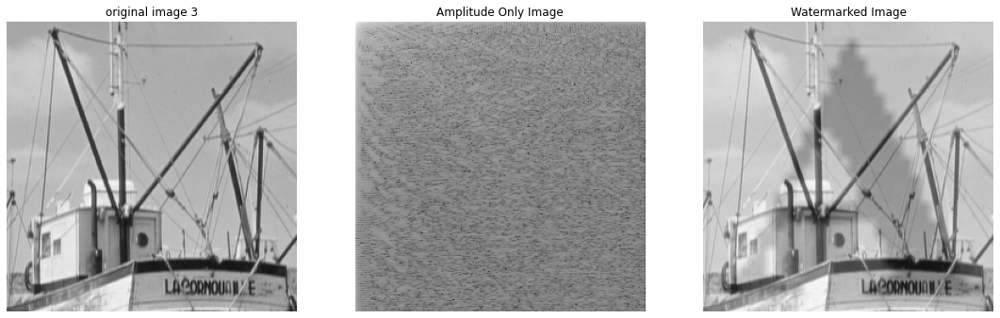

In [247]:
# apply dct2 to image
image3, dct2_im3_aoi, dct2_im3_watermark = dct2_watermark(image3)
# show images -> 2DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image3, 'gray'), plt.axis('off'), plt.title('original image 3')
plt.subplot(152), plt.imshow(dct2_im3_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_im3_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [248]:
# Calculate PSNR of 2DCT
MSE = 0
height, width = image3.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_im3_watermark[i,j] - image3[i,j]),2) / (height*width)

dct2_im3psnr = 20*np.log10(np.amax(image3)) - 10*np.log10(MSE)
print('image3 psnr: ', dct2_im3psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image3 psnr:  0.6779499461650147


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5737cf28>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

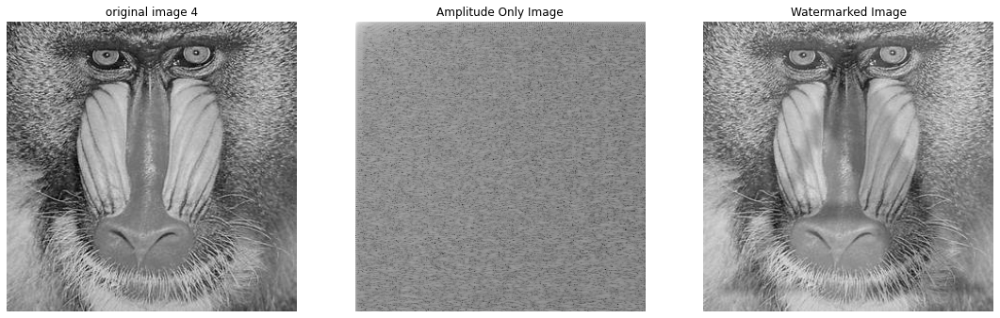

In [249]:
# apply dct2 to image
image4, dct2_im4_aoi, dct2_im4_watermark = dct2_watermark(image4)
# show images -> 2DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image4, 'gray'), plt.axis('off'), plt.title('original image 4')
plt.subplot(152), plt.imshow(dct2_im4_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_im4_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [250]:
# Calculate PSNR of 2DCT
MSE = 0
height, width = image4.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_im4_watermark[i,j] - image4[i,j]),2) / (height*width)

dct2_im4psnr = 20*np.log10(np.amax(image4)) - 10*np.log10(MSE)
print('image4 psnr: ', dct2_im4psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image4 psnr:  1.8416724210815545


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57270c18>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

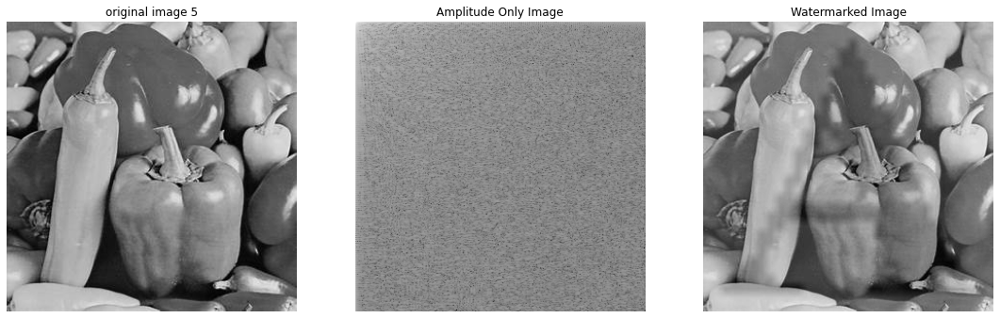

In [251]:
# apply dct2 to image
image5, dct2_im5_aoi, dct2_im5_watermark = dct2_watermark(image5)
# show images -> 2DCT
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image5, 'gray'), plt.axis('off'), plt.title('original image 5')
plt.subplot(152), plt.imshow(dct2_im5_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_im5_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [252]:
# Calculate PSNR of 2DCT
MSE = 0
height, width = image5.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_im5_watermark[i,j] - image5[i,j]),2) / (height*width)

dct2_im5psnr = 20*np.log10(np.amax(image5)) - 10*np.log10(MSE)
print('image5 psnr: ', dct2_im5psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image5 psnr:  2.129119056671449


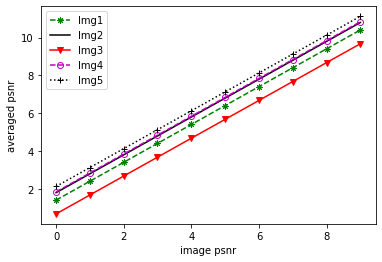

In [253]:
# plot psnr of images 2DCT
x=np.arange(10)
fig=plt.figure()
ax=fig.add_subplot()
ax.plot(x,x+dct2_im1psnr,c='g',marker=(8,2,0),ls='--',label='Img1')
ax.plot(x,x+dct2_im2psnr,c='k',ls='-',label='Img2')
ax.plot(x,x+dct2_im3psnr,c='r',marker="v",ls='-',label='Img3')
ax.plot(x,x+dct2_im4psnr,c='m',marker="o",ls='--',label='Img4',fillstyle='none')
ax.plot(x,x+dct2_im5psnr,c='k',marker="+",ls=':',label='Img5')
plt.xlabel('image psnr')
plt.ylabel('averaged psnr')
plt.legend(loc=2)
plt.show()

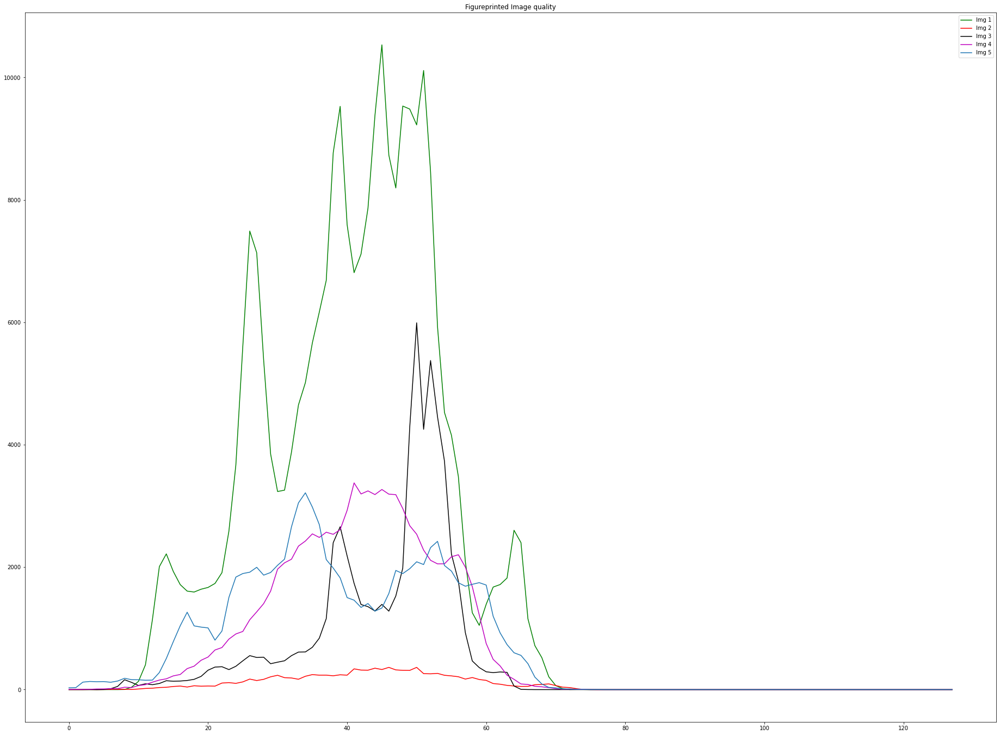

In [254]:
## CALLING OPNECV INBUILT HISTOGRAM FUNCTION
# 2DCT watermark image

dct2_im1_hist = cv2.calcHist([dct2_im1_watermark],[0],None,[128],[0,256])
dct2_im2_hist = cv2.calcHist([dct2_im2_watermark],[0],None,[128],[0,256])
dct2_im3_hist = cv2.calcHist([dct2_im3_watermark],[0],None,[128],[0,256])
dct2_im4_hist = cv2.calcHist([dct2_im4_watermark],[0],None,[128],[0,256])
dct2_im5_hist = cv2.calcHist([dct2_im5_watermark],[0],None,[128],[0,256])
 
## PLOTTING HISTOGRAM FOR VERIFICATION
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.title("Figureprinted Image quality")
plt.plot(dct2_im1_hist,'g', label="Img 1") 
plt.plot(dct2_im2_hist,'r', label="Img 2") 
plt.plot(dct2_im3_hist,'k', label="Img 3") 
plt.plot(dct2_im4_hist,'m', label="Img 4") 
plt.plot(dct2_im5_hist, label="Img 5") 
plt.legend()
plt.show()

2DCT with rsa

In [0]:
# define dct2 rsa function to extract amplitude only image and watermarked image

def dct2_rsa_watermark(image):
  # apply dct2 to images
  dct2_im1 = dct(dct(image))
  dct2_im1_amp = np.log(10 + np.abs(dct2_im1))   #amplitude

  h, w = image.shape
  dct2r_im1 = cv2.dct(np.float32(image)/ 255.0)
  dct2r_im1 = dct2r_im1*255.0
  dct2_im1_amp, sign = random_sign(dct2r_im1)
  dct_rsa = rsa(h, w, seed=13)
  dct_amplitude_img = add_rsa(dct2_im1_amp, dct_rsa)  
  dct2_rsa_im1_aoi = cv2.idct(dct_amplitude_img)  #amplitude only image with rsa seed 13
 
  src2 = cv2.resize(mask, dct2_rsa_im1_aoi.shape)
  dct2_rsa_im1_watermark = cv2.addWeighted(image, 0.5, src2, 0.1, 0)

  return image, dct2_rsa_im1_aoi, dct2_rsa_im1_watermark

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf5706f160>,
 (-0.5, 511.5, 511.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

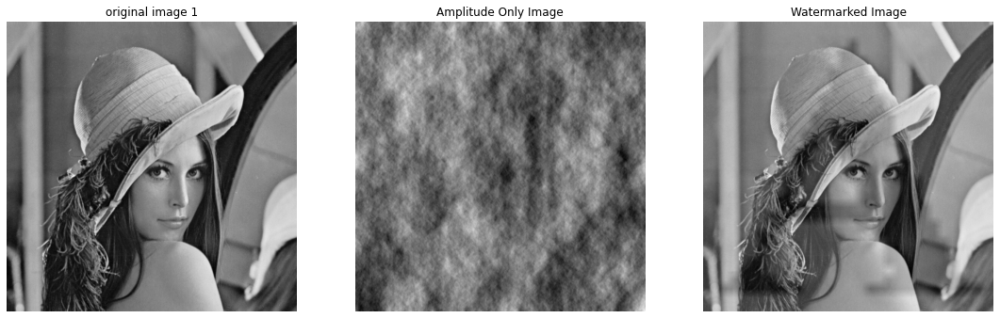

In [256]:
# apply dct2 w/ rsa to image
image1, dct2_rsa_im1_aoi, dct2_rsa_im1_watermark = dct2_rsa_watermark(image1)
# show images -> 2DCT w/ rsa
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image1, 'gray'), plt.axis('off'), plt.title('original image 1')
plt.subplot(152), plt.imshow(dct2_rsa_im1_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_rsa_im1_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [257]:
# Calculate PSNR of 2DCT w/ rsa
MSE = 0
height, width = image1.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_rsa_im1_watermark[i,j] - image1[i,j]),2) / (height*width)

dct2_rsa_im1psnr = 20*np.log10(np.amax(image1)) - 10*np.log10(MSE)
print('image1 psnr: ', dct2_rsa_im1psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image1 psnr:  1.4060762986521453


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf56fd8e10>,
 (-0.5, 101.5, 101.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

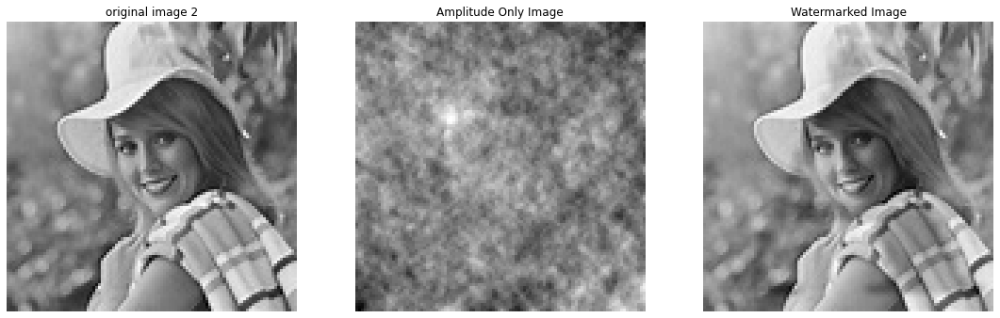

In [258]:
# apply dct2 w/ rsa to image
image2, dct2_rsa_im2_aoi, dct2_rsa_im2_watermark = dct2_rsa_watermark(image2)
# show images -> 2DCT w/ rsa
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image2, 'gray'), plt.axis('off'), plt.title('original image 2')
plt.subplot(152), plt.imshow(dct2_rsa_im2_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_rsa_im2_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [259]:
# Calculate PSNR of 2DCT w/ rsa
MSE = 0
height, width = image2.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_rsa_im2_watermark[i,j] - image2[i,j]),2) / (height*width)

dct2_rsa_im2psnr = 20*np.log10(np.amax(image2)) - 10*np.log10(MSE)
print('image2 psnr: ', dct2_rsa_im2psnr)

image2 psnr:  1.7992403176444611


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf56eceb00>,
 (-0.5, 255.5, 255.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

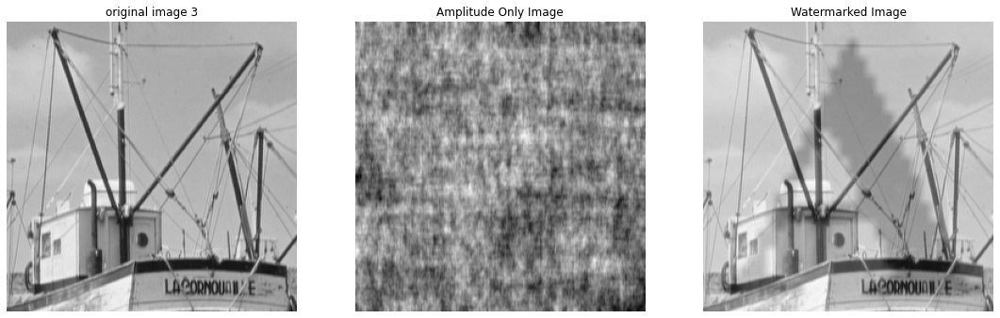

In [260]:
# apply dct2 w/ rsa to image
image3, dct2_rsa_im3_aoi, dct2_rsa_im3_watermark = dct2_rsa_watermark(image3)
# show images -> 2DCT w/ rsa
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image3, 'gray'), plt.axis('off'), plt.title('original image 3')
plt.subplot(152), plt.imshow(dct2_rsa_im3_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_rsa_im3_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [261]:
# Calculate PSNR of 2DCT w/ rsa
MSE = 0
height, width = image3.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_rsa_im3_watermark[i,j] - image3[i,j]),2) / (height*width)

dct2_rsa_im3psnr = 20*np.log10(np.amax(image3)) - 10*np.log10(MSE)
print('image3 psnr: ', dct2_rsa_im3psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image3 psnr:  0.6779499461650147


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf56dc47f0>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

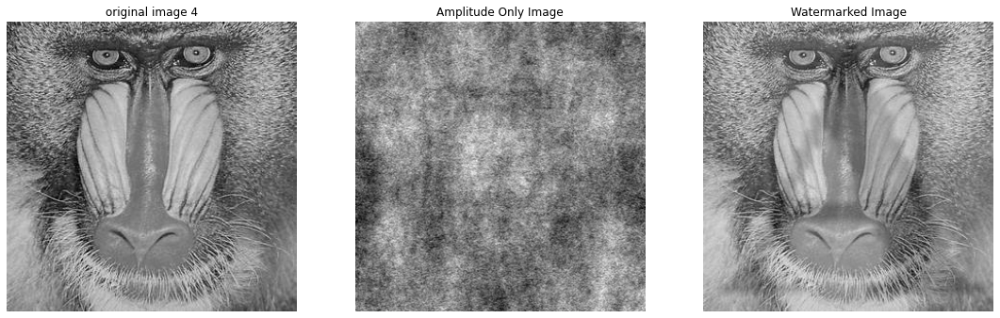

In [262]:
# apply dct2 w/ rsa to image
image4, dct2_rsa_im4_aoi, dct2_rsa_im4_watermark = dct2_rsa_watermark(image4)
# show images -> 2DCT w/ rsa
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image4, 'gray'), plt.axis('off'), plt.title('original image 4')
plt.subplot(152), plt.imshow(dct2_rsa_im4_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_rsa_im4_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [263]:
# Calculate PSNR of 2DCT w/ rsa
MSE = 0
height, width = image4.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_rsa_im4_watermark[i,j] - image4[i,j]),2) / (height*width)

dct2_rsa_im4psnr = 20*np.log10(np.amax(image4)) - 10*np.log10(MSE)
print('image4 psnr: ', dct2_rsa_im4psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image4 psnr:  1.8416724210815545


(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf56cb84e0>,
 (-0.5, 299.5, 299.5, -0.5),
 Text(0.5, 1.0, 'Watermarked Image'))

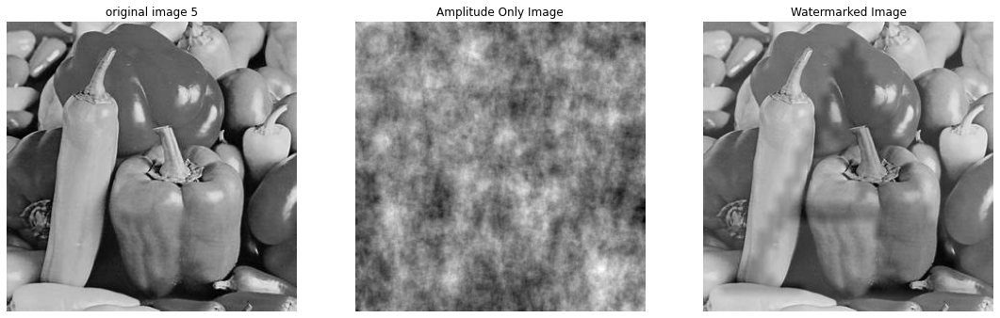

In [264]:
# apply dct2 w/ rsa to image
image5, dct2_rsa_im5_aoi, dct2_rsa_im5_watermark = dct2_rsa_watermark(image5)
# show images -> 2DCT w/ rsa
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image5, 'gray'), plt.axis('off'), plt.title('original image 5')
plt.subplot(152), plt.imshow(dct2_rsa_im5_aoi, 'gray'), plt.axis('off'), plt.title('Amplitude Only Image')
plt.subplot(153), plt.imshow(dct2_rsa_im5_watermark, 'gray'), plt.axis('off'), plt.title('Watermarked Image')

In [265]:
# Calculate PSNR of 2DCT w/ rsa
MSE = 0
height, width = image5.shape
for i in range(height):
  for j in range(width):
    MSE = MSE + np.power((dct2_rsa_im5_watermark[i,j] - image5[i,j]),2) / (height*width)

dct2_rsa_im5psnr = 20*np.log10(np.amax(image5)) - 10*np.log10(MSE)
print('image5 psnr: ', dct2_rsa_im5psnr)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in ubyte_scalars
  """


image5 psnr:  2.129119056671449


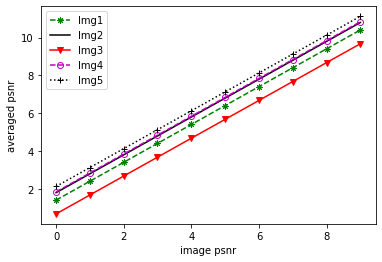

In [266]:
# plot psnr of images 2DCT w/ rsa
x=np.arange(10)
fig=plt.figure()
ax=fig.add_subplot()
ax.plot(x,x+dct2_rsa_im1psnr,c='g',marker=(8,2,0),ls='--',label='Img1')
ax.plot(x,x+dct2_rsa_im2psnr,c='k',ls='-',label='Img2')
ax.plot(x,x+dct2_rsa_im3psnr,c='r',marker="v",ls='-',label='Img3')
ax.plot(x,x+dct2_rsa_im4psnr,c='m',marker="o",ls='--',label='Img4',fillstyle='none')
ax.plot(x,x+dct2_rsa_im5psnr,c='k',marker="+",ls=':',label='Img5')
plt.xlabel('image psnr')
plt.ylabel('averaged psnr')
plt.legend(loc=2)
plt.show()

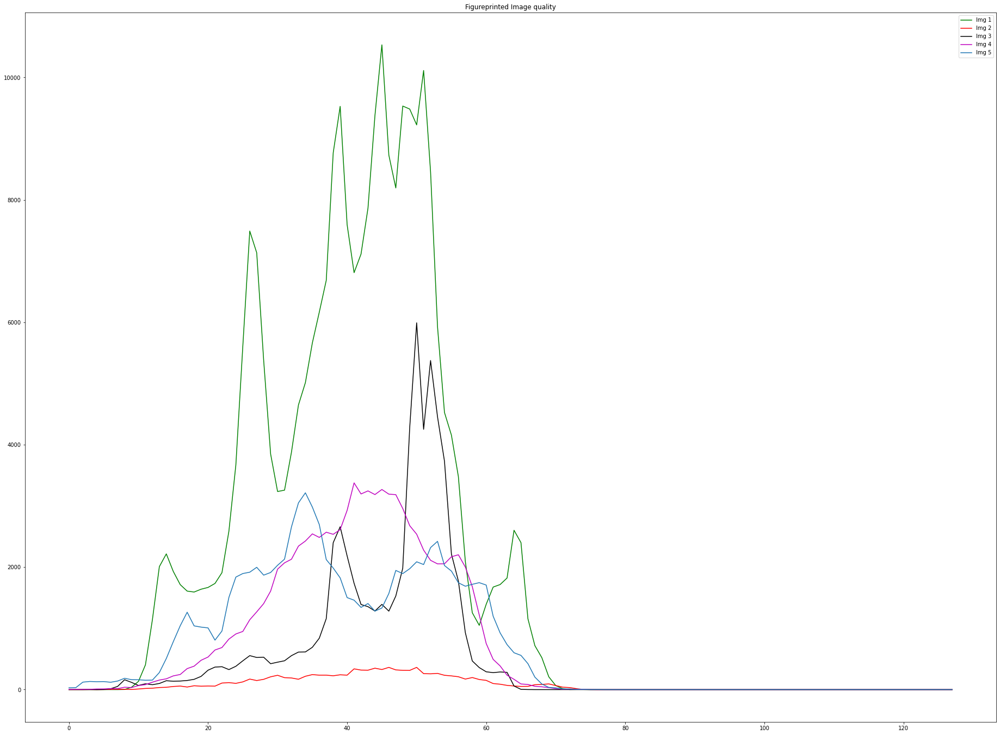

In [267]:
## CALLING OPNECV INBUILT HISTOGRAM FUNCTION
# 2DCT w/ rsa watermark image

dct2_rsa_im1_hist = cv2.calcHist([dct2_rsa_im1_watermark],[0],None,[128],[0,256])
dct2_rsa_im2_hist = cv2.calcHist([dct2_rsa_im2_watermark],[0],None,[128],[0,256])
dct2_rsa_im3_hist = cv2.calcHist([dct2_rsa_im3_watermark],[0],None,[128],[0,256])
dct2_rsa_im4_hist = cv2.calcHist([dct2_rsa_im4_watermark],[0],None,[128],[0,256])
dct2_rsa_im5_hist = cv2.calcHist([dct2_rsa_im5_watermark],[0],None,[128],[0,256])
 
## PLOTTING HISTOGRAM FOR VERIFICATION
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.title("Figureprinted Image quality")
plt.plot(dct2_rsa_im1_hist,'g', label="Img 1") 
plt.plot(dct2_rsa_im2_hist,'r', label="Img 2") 
plt.plot(dct2_rsa_im3_hist,'k', label="Img 3") 
plt.plot(dct2_rsa_im4_hist,'m', label="Img 4") 
plt.plot(dct2_rsa_im5_hist, label="Img 5") 
plt.legend()
plt.show()

The psnr values of 2DCT w/ rsa are lower then the psnr values of 2DCT. 

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57d08908>,
 (-0.5, 511.5, 511.5, -0.5),
 Text(0.5, 1.0, 'AOI 2DFT w/ rsa'))

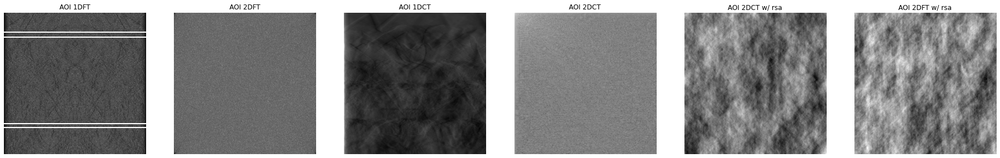

In [268]:
# AOI of 1D DFT, 2D DFT, 1DCT, 2DCT 
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(imdft1_aoi, 'gray'), plt.axis('off'), plt.title('AOI 1DFT')
plt.subplot(162), plt.imshow(im1_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DFT')
plt.subplot(163), plt.imshow(im1_dct_aoi, 'gray'), plt.axis('off'), plt.title('AOI 1DCT')
plt.subplot(164), plt.imshow(dct2_im1_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DCT')
plt.subplot(165), plt.imshow(dct2_rsa_im1_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DCT w/ rsa')
plt.subplot(166), plt.imshow(im1_rsa_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DFT w/ rsa')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcf57160940>,
 (-0.5, 101.5, 101.5, -0.5),
 Text(0.5, 1.0, 'AOI 2DFT w/ rsa'))

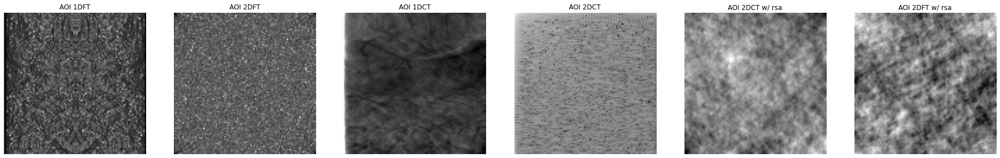

In [269]:
# AOI of 1D DFT, 2D DFT, 1DCT, 2DCT 
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161),plt.imshow(imdft2_aoi, 'gray'), plt.axis('off'), plt.title('AOI 1DFT')
plt.subplot(162), plt.imshow(im2_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DFT')
plt.subplot(163), plt.imshow(im2_dct_aoi, 'gray'), plt.axis('off'), plt.title('AOI 1DCT')
plt.subplot(164), plt.imshow(dct2_im2_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DCT')
plt.subplot(165), plt.imshow(dct2_rsa_im2_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DCT w/ rsa')
plt.subplot(166), plt.imshow(im2_rsa_aoi, 'gray'), plt.axis('off'), plt.title('AOI 2DFT w/ rsa')

Random sign assignment does not destroy the invisibility of the amplitude-only images.